In [ ]:
!pip install numpy
!pip install scipy
!pip install matplotlib
!pip install Pandas
!pip install python-docx

!pip install soundfile
!pip install sounddevice
!sudo apt-get install libportaudio2

!pip install Pillow
!pip install pylibjpeg-libjpeg
!pip install opencv-contrib-python
!pip install -U scikit-learn
!pip install scikit-image

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.fftpack
import sounddevice as sd
import soundfile as sf
import time
from IPython.display import Audio
from IPython.display import display
from scipy.interpolate import interp1d


def kwant_sound(sound_clip, bit_amount):
    levels = 2**bit_amount

    if np.issubdtype(sound_clip.dtype, np.floating):
        m = np.min(sound_clip)
        n = np.max(sound_clip)
        range_span = n - m
    else:
        np.issubdtype(sound_clip.dtype, np.integer)
        info = np.iinfo(sound_clip.dtype)
        m = info.min
        n = info.max
        range_span = n - m + 1


    # normalizacja/konwersja
    new_sound = sound_clip.astype(np.float32)
    new_sound = (new_sound - m) / range_span

    # żeby przedziały były równe
    quantized = np.minimum(np.floor(new_sound * levels), levels - 1)
    new_sound = (quantized + 0.5) / levels

    # powrót
    new_sound = new_sound * (n - m) + m

    # argh teraz działa
    if np.issubdtype(sound_clip.dtype, np.integer):
        new_sound = np.clip(new_sound, m, n).astype(sound_clip.dtype)
    else:
        new_sound = new_sound.astype(sound_clip.dtype)

    return new_sound


#bierze co n-ta próbkę z pliku źródłowego
def dec_sound(sound_clip, fs, n_interval):
  #jest git
  new_sound = sound_clip[:: n_interval]
  new_fs = fs/n_interval
  return new_sound, new_fs


def sound_interp(y, fs_orig, fs_new, method='linear'):
    # czas dla oryginalnych próbek
    duration = len(y) / fs_orig
    x = np.linspace(0, duration, num=len(y), endpoint=False)

    # czas dla nowych próbek
    num_samples_new = int(np.round(duration * fs_new))
    x_new = np.linspace(0, duration, num=num_samples_new, endpoint=False)

    interpolator = interp1d(x, y, kind=method)

    # nowy sygnał
    y_new = interpolator(x_new)

    return y_new.astype(y.dtype)

def test_kwant(sound_clip, max_bits):
    curr_bits = 1
    pos = 1
    fig = plt.figure(figsize=(16,9))
    while curr_bits <= max_bits:
        plt.subplot(max_bits, 1, pos)
        new_sound = kwant_sound(sound_clip, curr_bits)
        plt.plot(new_sound)
        plt.title(f"kwantyzacja na {curr_bits} bitach")
        curr_bits +=1
        pos += 1

    fig.suptitle(f"Kwantyzacja", fontsize=16)
    plt.tight_layout()
    plt.show()
    return




ModuleNotFoundError: No module named 'sounddevice'

In [ ]:
def compute_fft(signal, fs):
    yf = scipy.fftpack.fft(signal)
    amplitude_db = 20 * np.log10(np.abs(yf) + 1e-12)
    freqs = np.arange(0, fs, fs / yf.size)
    return freqs[:yf.size // 2], amplitude_db[:yf.size // 2]


def plot_interp(sound_clip, fs_orig, fs_new, message, time_margin=[0, 0.02]):
    for pos, fs in enumerate(fs_new, start=1):
        # interpoacje
        new_sound_lin = sound_interp(sound_clip, fs_orig, fs, method='linear')
        new_sound_cub = sound_interp(sound_clip, fs_orig, fs, method='cubic')

        # amplituda/czas
        fig_time, ax_time = plt.subplots(figsize=(16, 5))
        ax_time.plot(np.arange(0, new_sound_lin.shape[0]) / fs, new_sound_lin,
                     color='red', linestyle='-', marker='o', markersize=5, label='Linear')
        ax_time.plot(np.arange(0, new_sound_cub.shape[0]) / fs, new_sound_cub,
                     color='green', linestyle='-', marker='x', markersize=5, label='Cubic')
        ax_time.plot(np.arange(0, sound_clip.shape[0]) / fs_orig, sound_clip,
                     color='blue', linestyle='--', marker='o', markersize=5, alpha=0.2, label='Oryginalny')
        ax_time.set_xlim(time_margin[0], time_margin[1])
        ax_time.set_title(f"{fs_orig}Hz vs {fs}Hz – Dziedzina czasu")
        ax_time.set_xlabel("Czas [s]")
        ax_time.set_ylabel("Amplituda")
        ax_time.legend()
        ax_time.grid(True, linestyle=':', alpha=0.3)
        fig_time.suptitle(f"{message} ({fs_orig}Hz vs {fs}Hz)", fontsize=16)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # ffts
        f_lin, db_lin = compute_fft(new_sound_lin, fs)
        f_cub, db_cub = compute_fft(new_sound_cub, fs)
        f_org, db_org = compute_fft(sound_clip, fs_orig)

        # linear orig
        fig_fft_lin, ax_fft_lin = plt.subplots(figsize=(16, 4))
        ax_fft_lin.plot(f_lin, db_lin, color='red', label='Linear')
        ax_fft_lin.plot(f_org, db_org, color='blue', linestyle='--', alpha=0.5, label='Oryginalny')
        ax_fft_lin.set_title("Widmo amplitudowe (Linear vs Oryginalny)")
        ax_fft_lin.set_xlabel("Częstotliwość [Hz]")
        ax_fft_lin.set_ylabel("Amplituda [dB]")
        ax_fft_lin.set_xlim(0, fs_orig / 2)
        ax_fft_lin.set_ylim(0)
        ax_fft_lin.legend()
        ax_fft_lin.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout()
        plt.show()

        # cubic orig
        fig_fft_cub, ax_fft_cub = plt.subplots(figsize=(16, 4))
        ax_fft_cub.plot(f_cub, db_cub, color='green', label='Cubic')
        ax_fft_cub.plot(f_org, db_org, color='blue', linestyle='--', alpha=0.5, label='Oryginalny')
        ax_fft_cub.set_title("Widmo amplitudowe (Cubic vs Oryginalny)")
        ax_fft_cub.set_xlabel("Częstotliwość [Hz]")
        ax_fft_cub.set_ylabel("Amplituda [dB]")
        ax_fft_cub.set_xlim(0, fs_orig / 2)
        ax_fft_cub.set_ylim(0)
        ax_fft_cub.legend()
        ax_fft_cub.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout()
        plt.show()


def plot_dec(sound_clip, fs_orig, intervals, message, time_margin=[0, 0.02]):
    for pos, interval in enumerate(intervals, start=1):
        # decymacja
        new_sound, new_fs = dec_sound(sound_clip, fs_orig, interval)

        # amplituda/czas
        fig_time, ax_time = plt.subplots(figsize=(16, 5))
        ax_time.plot(np.arange(0, new_sound.shape[0]) / new_fs, new_sound,
                     color='red', linestyle='-', marker='o', markersize=5, label='Decymowany')
        ax_time.plot(np.arange(0, sound_clip.shape[0]) / fs_orig, sound_clip,
                     color='blue', linestyle='--', marker='o', markersize=5, alpha=0.2, label='Oryginalny')
        ax_time.set_xlim(time_margin[0], time_margin[1])
        ax_time.set_title(f"Decymacja z krokiem {interval}")
        ax_time.set_xlabel("Czas [s]")
        ax_time.set_ylabel("Amplituda")
        ax_time.legend()
        ax_time.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # obliczenie FFT
        f_dec, db_dec = compute_fft(new_sound, new_fs)
        f_org, db_org = compute_fft(sound_clip, fs_orig)

        # widmo amplitudowe
        fig_fft, ax_fft = plt.subplots(figsize=(16, 4))
        ax_fft.plot(f_dec, db_dec, color='red', label='Decymowany')
        ax_fft.plot(f_org, db_org, color='blue', linestyle='--', alpha=0.5, label='Oryginalny')
        ax_fft.set_title(f"Widmo amplitudowe (Decymacja krok {interval})")
        ax_fft.set_xlabel("Częstotliwość [Hz]")
        ax_fft.set_ylabel("Amplituda [dB]")
        ax_fft.set_xlim(0, fs_orig / 2)
        ax_fft.set_ylim(0)
        ax_fft.legend()
        ax_fft.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout()
        plt.show()


def plot_kwant(sound_clip, fs_orig, bits, message, time_margin=[0, 0.02]):
    for pos, bit in enumerate(bits, start=1):
        # decymacja
        new_sound = kwant_sound(sound_clip, bit)

        # amplituda/czas
        fig_time, ax_time = plt.subplots(figsize=(16, 5))
        ax_time.plot(np.arange(0, new_sound.shape[0]) / fs_orig, new_sound,
                     color='red', linestyle='-', marker='o', markersize=5, label='Kwantowany')
        ax_time.plot(np.arange(0, sound_clip.shape[0]) / fs_orig, sound_clip,
                     color='blue', linestyle='--', marker='o', markersize=5, alpha=0.2, label='Oryginalny')
        ax_time.set_xlim(time_margin[0], time_margin[1])
        ax_time.set_title(f"Kwantowanie na {bit} bitach")
        ax_time.set_xlabel("Czas [s]")
        ax_time.set_ylabel("Amplituda")
        ax_time.legend()
        ax_time.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

        # obliczenie FFT
        f_kwant, db_kwant = compute_fft(new_sound, fs_orig)
        f_org, db_org = compute_fft(sound_clip, fs_orig)

        # widmo amplitudowe
        fig_fft, ax_fft = plt.subplots(figsize=(16, 4))
        ax_fft.plot(f_kwant, db_kwant, color='red', label='Kwantowany')
        ax_fft.plot(f_org, db_org, color='blue', linestyle='--', alpha=0.5, label='Oryginalny')
        ax_fft.set_title(f"Widmo amplitudowe (Kwantowanie na {bit} bitach)")
        ax_fft.set_xlabel("Częstotliwość [Hz]")
        ax_fft.set_ylabel("Amplituda [dB]")
        ax_fft.set_xlim(0, fs_orig / 2)
        ax_fft.set_ylim(0)
        ax_fft.legend()
        ax_fft.grid(True, linestyle=':', alpha=0.3)
        plt.tight_layout()
        plt.show()

(48000,)
[ 0.          0.04605122  0.09194972 ... -0.13754328 -0.09194972
 -0.04605122]


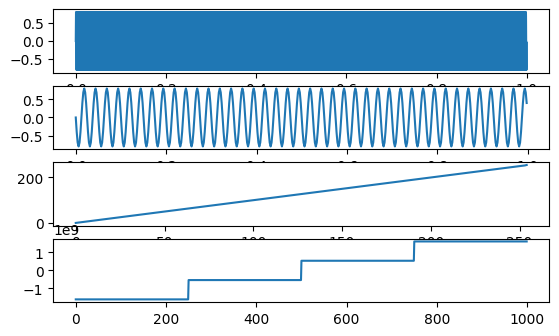

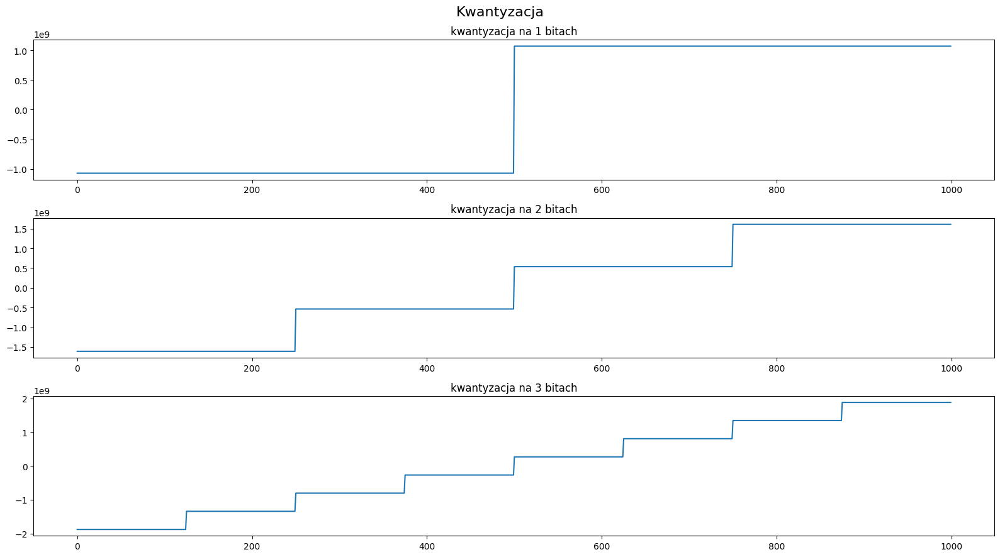

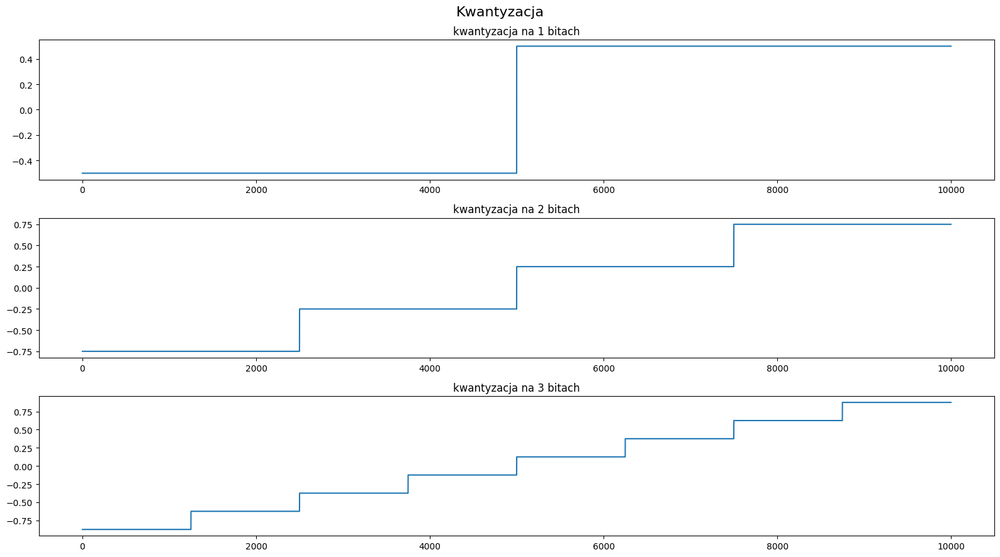

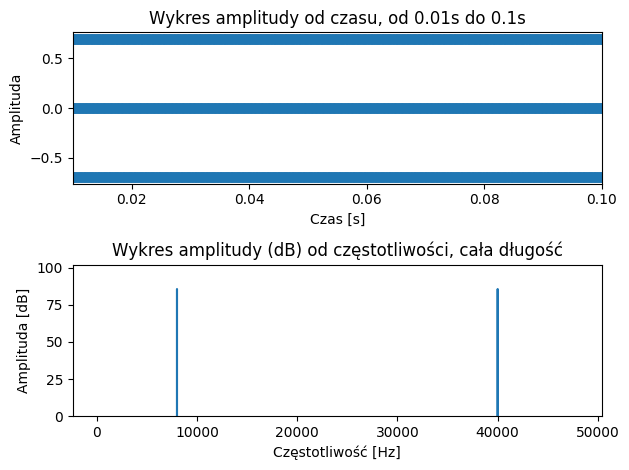

48000 (48000,)
(24000,)


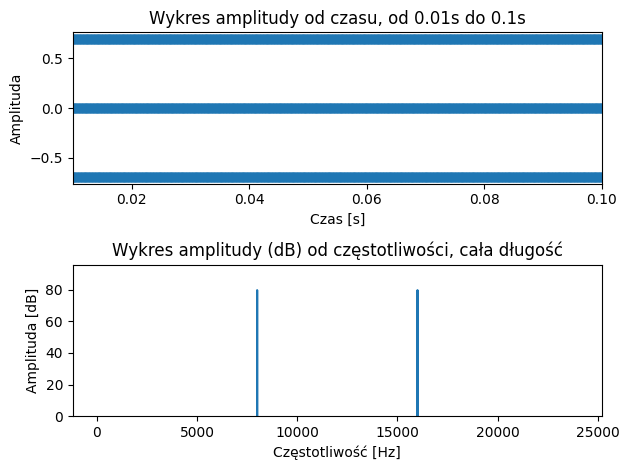

"l_data = data[:,0]\nsf.write('l_sound.wav', l_data, fs)\nwn = Audio('l_sound.wav', autoplay=True)\ndisplay(wn)\ntime.sleep(8)\n"

In [ ]:
data, fs = sf.read('/content/sin_440Hz.wav', dtype='float32')
plt.subplot(5,1,1)
print(data.shape)

plt.plot(np.arange(0,data.shape[0])/fs,data)
print(data)

ns, nfs = dec_sound(data, fs, 100)
plt.subplot(5,1,2)
plt.plot(np.arange(0,ns.shape[0])/nfs,ns)

test_uint8 = np.round(np.linspace(0,255,255,dtype=np.uint8))
test_int32 = np.round(np.linspace(np.iinfo(np.int32).min,np.iinfo(np.int32).max,1000,dtype=np.int32))
test_float32 = np.linspace(-1,1,10000)

plt.subplot(5, 1, 3)
plt.plot(test_uint8)
plt.subplot(5, 1, 4)
plt.plot(kwant_sound(test_int32, 2))

test_kwant(test_int32, 3)
test_kwant(test_float32, 3)

'''data, fs = sf.read('/content/sin_8000Hz.wav', dtype='float32')
plotAudio(data, fs, time_margin=[0.01, 0.1])
print(fs, data.shape)
new_data = sound_interp(data, fs, 24000)
print(new_data.shape)
plotAudio(new_data, 24000, time_margin=[0.01, 0.1])

l_data = data[:,0]
sf.write('l_sound.wav', l_data, fs)
wn = Audio('l_sound.wav', autoplay=True)
display(wn)
time.sleep(8)
'''

In [ ]:
data, fs = sf.read('/content/sin_combined.wav', dtype='float32')
plot_interp(data, fs, [4000, 8000, 11999, 16000, 16953], 'interpolacja', [0, 0.005])
plot_dec(data, fs, [2, 4, 8, 10, 24], 'decymacja', [0, 0.005])
plot_kwant(data, fs, [4, 8, 16, 24], 'kwantyzacja', [0, 0.005])

NameError: name 'sf' is not defined

In [ ]:
def sound_check_kwant(path, sound_len, bits):
    data, fs = sf.read(path, dtype='float32')
    sf.write('sound.wav', data, fs)
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    new_data = kwant_sound(data, bits)
    sf.write('sound.wav', new_data, fs)
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    return

def sound_check_dec(path, sound_len, interval):
    data, fs = sf.read(path, dtype='float32')
    sf.write('sound.wav', data, fs)
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    new_data, new_fs = dec_sound(data, fs, interval)
    sf.write('sound.wav', new_data, int(new_fs))
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    return

def sound_check_interp(path, sound_len, new_fs):
    data, fs = sf.read(path, dtype='float32')
    sf.write('sound.wav', data, fs)
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    new_data = sound_interp(data, fs, new_fs)
    sf.write('sound.wav', new_data, new_fs)
    wn = Audio('sound.wav', autoplay=True)
    display(wn)
    time.sleep(sound_len)

    return

In [ ]:
sound_check_kwant('/content/sing_lme1.wav', 5, 4)
sound_check_kwant('/content/sing_low1.wav', 5, 8)

sound_check_dec('/content/sing_low1.wav', 5, 4)
sound_check_dec('/content/sing_low1.wav', 5, 6)
sound_check_dec('/content/sing_low1.wav', 5, 10)
sound_check_dec('/content/sing_low1.wav', 5, 24)

sound_check_interp('/content/sing_low1.wav', 5, 4000)
sound_check_interp('/content/sing_low1.wav', 5, 8000)
sound_check_interp('/content/sing_low1.wav', 5, 11999)
sound_check_interp('/content/sing_low1.wav', 5, 16000)
sound_check_interp('/content/sing_low1.wav', 5, 16953)

In [ ]:
sound_check_kwant('/content/sing_medium1.wav', 5, 4)
sound_check_kwant('/content/sing_medium1.wav', 5, 8)

sound_check_dec('/content/sing_medium1.wav', 5, 4)
sound_check_dec('/content/sing_medium1.wav', 5, 6)
sound_check_dec('/content/sing_medium1.wav', 5, 10)
sound_check_dec('/content/sing_medium1.wav', 5, 24)

sound_check_interp('/content/sing_medium1.wav', 5, 4000)
sound_check_interp('/content/sing_medium1.wav', 5, 8000)
sound_check_interp('/content/sing_medium1.wav', 5, 11999)
sound_check_interp('/content/sing_medium1.wav', 5, 16000)
sound_check_interp('/content/sing_medium1.wav', 5, 16953)

In [ ]:
'''sound_check_kwant('/content/sing_high1.wav', 8, 4)
sound_check_kwant('/content/sing_high1.wav', 8, 8)

sound_check_dec('/content/sing_high1.wav', 8, 4)
sound_check_dec('/content/sing_high1.wav', 8, 6)
sound_check_dec('/content/sing_high1.wav', 8, 10)
sound_check_dec('/content/sing_high1.wav', 8, 24)'''

sound_check_interp('/content/sing_high1.wav', 8, 4000)
sound_check_interp('/content/sing_high1.wav', 8, 8000)
sound_check_interp('/content/sing_high1.wav', 8, 11999)
sound_check_interp('/content/sing_high1.wav', 8, 16000)
sound_check_interp('/content/sing_high1.wav', 8, 16953)